In [1]:
import os
import math
import numpy as np
import pandas as pd
import scipy.io as scio
import scipy.stats as stat
import matplotlib.pyplot as plt
%matplotlib inline
import behavior.io as bio

In [2]:
# Basic info directory containing the mouse data
basedir = 'D:/2p_data/scan'
rig = 'lbr'

# Mouse, date, run info
mouse='HK17'
date = '190128'
runs = [1,2,3]

In [3]:
data = {}
for run in runs:
    simpPath = 'D:/2p_data/scan/HK17/190128_HK17/HK17_190128_00{}.simpcell'.format(run)
    data[run] = scio.loadmat(simpPath, squeeze_me= True, verify_compressed_data_integrity=True)
    

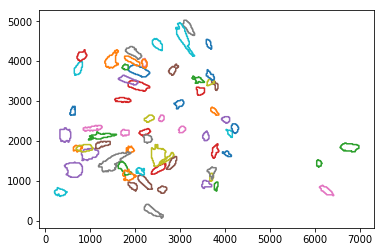

In [9]:
run = 1
for i in np.arange(0,len(data[run]['edges'])-1):
    mask = data[run]['edges'][i]
    plt.plot(mask[1:,0],mask[1:,1])
    

In [33]:
fr = data[1]['framerate']

dff = data[1]['dff']
condition =  data[1]['condition']
trialerror = data[1]['trialerror']

onsets = data[1]['onsets']
licking = data[1]['licking']

lastFrame = data[1]['dff'].shape[1]
for run in runs[1:]:
    dff = np.append(dff, data[run]['dff'], axis=1)
    condition = np.append(condition, data[run]['condition'], axis=0)
    trialerror = np.append(trialerror, data[run]['trialerror'], axis=0)
    
    onsets = np.append(onsets, data[run]['onsets'].astype('uint32') + lastFrame, axis=0)
    licking = np.append(licking, data[run]['licking'].astype('uint32') + lastFrame, axis=0)
    
    lastFrame += data[run-1]['dff'].shape[1]
    

In [140]:
def getTrials(data, onsets, preStim = 2, postStim = 8, zscore=True):
    trialTime = np.
    if zscore:
        data = stat.zscore(data)
        
    trialData = np.zeros([len(onsets), np.around(preStim * fr).astype('uint16')  + np.around(postStim * fr).astype('uint16')])

    for ind, onset in enumerate(onsets):
        trialNum = ind + 1
        trialData[ind] = data[onset - np.round(preStim * fr).astype('uint16') : onset + np.round(postStim * fr).astype('uint16')]
        
    return trialData, trialTime


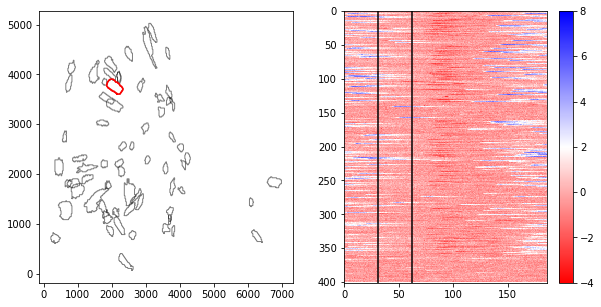

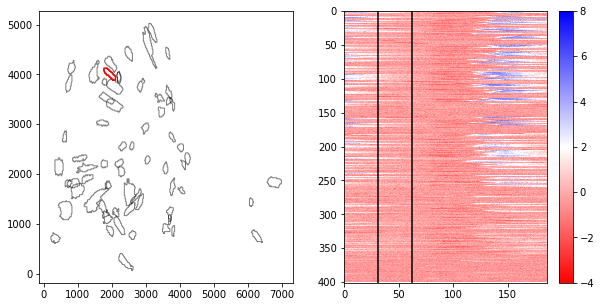

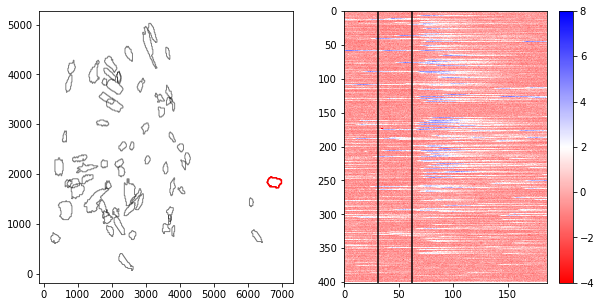

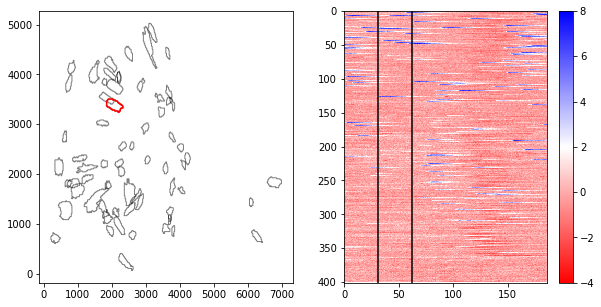

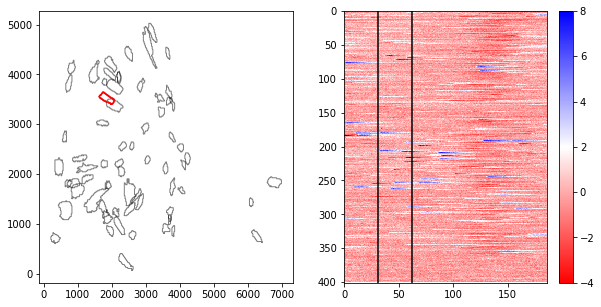

...

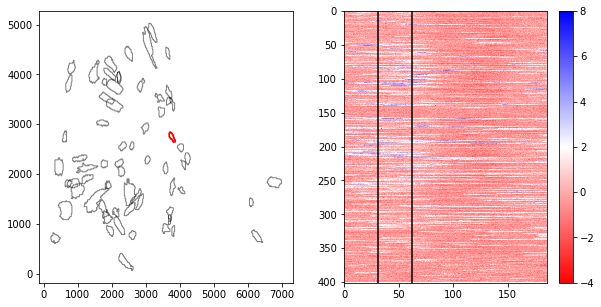

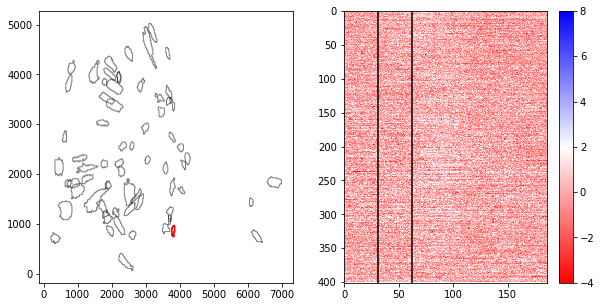

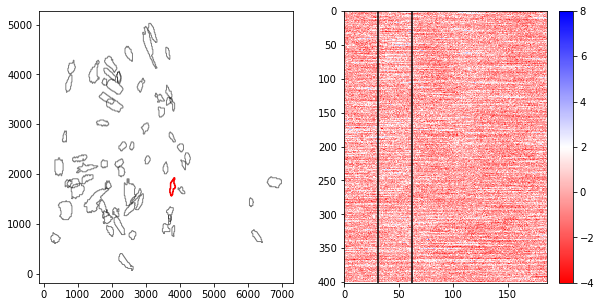

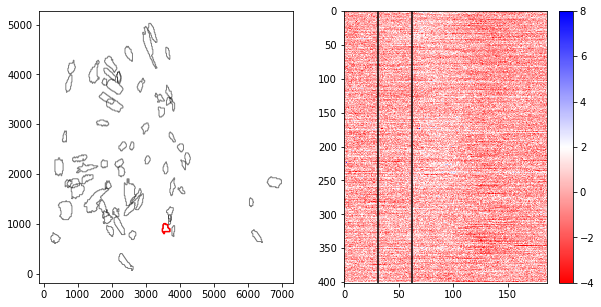

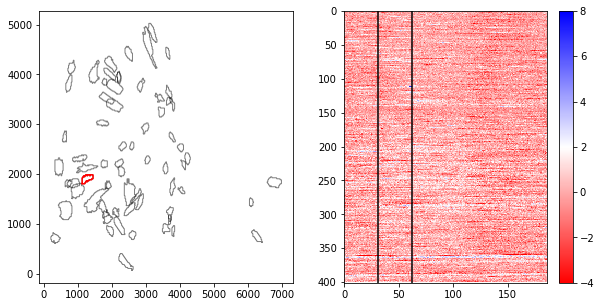

In [227]:
cellNum = 35

fig, [ax_, ax] = plt.subplots(1,2,figsize=(10, 5))

allTrials = plt.imshow(getTrials(dff[cellNum], onsets, preStim=4, postStim=8, zscore=True), cmap='bwr_r', aspect= 'auto', vmin=-4, vmax=8)
plt.colorbar(allTrials, ax=ax)
ax.vlines(np.around(preStim * fr).astype('uint16'), 0, len(onsets))
ax.vlines(np.around((preStim + 2) * fr).astype('uint16'), 0, len(onsets))
ax.set_ylim([len(onsets), 0])


run = 1
for i in np.arange(0,len(data[run]['edges'])-1):
    mask = data[run]['edges'][i]
    ax_.plot(mask[1:,0],mask[1:,1], 'k', alpha=0.5, linewidth=1)

mask = data[run]['edges'][cellNum]
ax_.plot(mask[1:,0],mask[1:,1], 'r')

In [229]:
data[1]

{'__header__': b'MATLAB 5.0 MAT-file, Platform: PCWIN64, Created on: Tue Jan 29 10:06:52 2019',
 '__version__': '1.0',
 '__globals__': [],
 'tags': array([], dtype=float64),
 'framerate': 15.49,
 'dff': array([[ 5.62219243e-01,  5.19195144e-01,  5.16270080e-01, ...,
          1.11362087e-01,  4.06818930e-02,  1.50029974e-01],
        [ 2.77017121e-01,  2.22683083e-01,  2.73801258e-01, ...,
          2.15922365e-01,  1.26215480e-01,  2.08238356e-01],
        [ 4.61396996e-02,  1.27693798e-02, -2.10621225e-02, ...,
          2.18264522e-01,  2.11860613e-01,  2.57748555e-01],
        ...,
        [ 5.61779411e-02,  6.47856195e-02, -2.11271642e-03, ...,
         -2.09136599e-04,  7.83802280e-02,  5.80146687e-02],
        [-2.55613687e-01,  2.01958817e-02,  7.23269223e-02, ...,
          8.70126554e-02,  7.67923581e-02,  1.09586757e-01],
        [ 1.66983116e-01,  2.04586185e-01,  1.40369084e-01, ...,
          1.45302931e-01,  5.16233529e-02,  3.86109735e-02]]),
 'neuropil': array([-0.0620

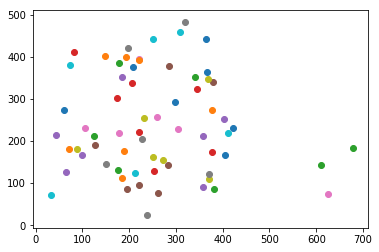

In [242]:
run = 1
for i in np.arange(0,len(data[run]['edges'])-1):
    mask = data[run]['edges'][i]
    cent = data[run]['centroid'][i]
#     plt.plot(mask[1:,0],mask[1:,1], 'k', alpha=0.5, linewidth=1)
    plt.scatter(cent[0], cent[1])